(10000, 2)

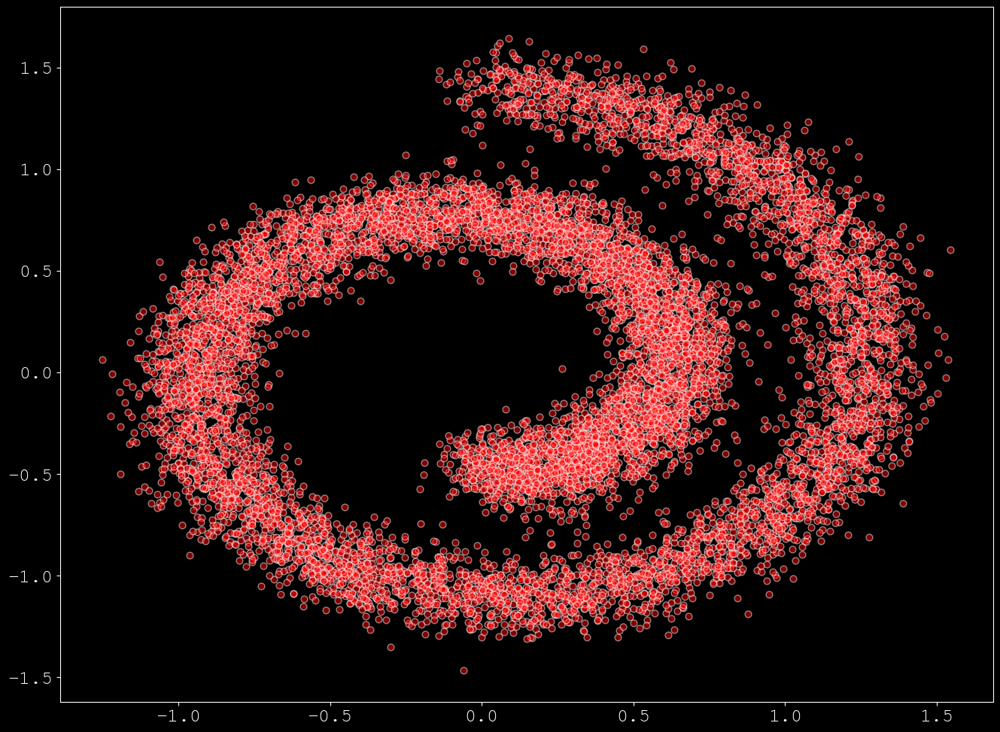

In [1]:
%matplotlib inline
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import jax
import jax.numpy as jnp
from sklearn.datasets import make_swiss_roll
from helper_plot import hdr_plot_style
from matplotlib import animation

hdr_plot_style()

Path("outputs").mkdir(exist_ok=True)

# Sample a batch from the swiss roll
def sample_batch(size, noise=1.0):
    x, _= make_swiss_roll(size, noise=noise)
    return x[:, [0, 2]] / 10.0
# Plot it
data = sample_batch(10**4).T
plt.figure(figsize=(16, 12))
plt.scatter(*data, alpha=0.5, color='red', edgecolor='white', s=40)

data = data.T
data.shape

In [2]:
import flax
import optax
from flax import linen as nn
from flax.training import train_state
from functools import partial
from tqdm import tqdm
# Our approximation model
class SimpleModel(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Dense(features=128)(x)
        x = nn.softplus(x)
        x = nn.Dense(features=128)(x)
        x = nn.softplus(x)
        x = nn.Dense(features=2)(x)
        return x

model = SimpleModel()

params = model.init(jax.random.PRNGKey(42), data)

# Create ADAM optimizer over our model
optimizer = optax.adam(1e-3)

state = train_state.TrainState.create(apply_fn=model.apply, params=params, tx=optimizer)

In [3]:
@jax.jit
def score_matching_loss(samples, params):
    N = np.prod(samples.shape)
    logp = model.apply(params, samples)
    norm_loss = jnp.linalg.norm(logp, axis=-1) ** 2 / 2.0
    
    def _sample_forward(x):
        return model.apply(params, x[None])[0]
    
    jacob_mat = jax.vmap(jax.jacrev(_sample_forward))(samples)
    tr_jacobian_loss = jnp.trace(jacob_mat, axis1=-2, axis2=-1)
    return (tr_jacobian_loss + norm_loss).mean()

In [4]:
steps = 50_000
@jax.jit
def train_step(state, batch):
  """Train for a single step."""
  grads = jax.grad(score_matching_loss, argnums=1)(batch, state.params)
  state = state.apply_gradients(grads=grads)
  return state
  
for t in tqdm(range(steps + 1)):
    batch_idx = np.random.choice(data.shape[0], size=128, replace=False)
    state = train_step(state, data[batch_idx])
    if ((t % (steps // 5)) == 0):
        print(score_matching_loss(data, state.params))

  0%|          | 157/50001 [00:01<04:57, 167.27it/s]

-0.17874694


 20%|██        | 10245/50001 [00:07<00:24, 1617.30it/s]

-40.910748


 41%|████      | 20327/50001 [00:14<00:18, 1647.95it/s]

-46.454185


 61%|██████    | 30285/50001 [00:20<00:12, 1595.09it/s]

-47.647747


 80%|████████  | 40190/50001 [00:26<00:06, 1620.12it/s]

-48.785797


100%|██████████| 50001/50001 [00:32<00:00, 1536.50it/s]

-49.32346


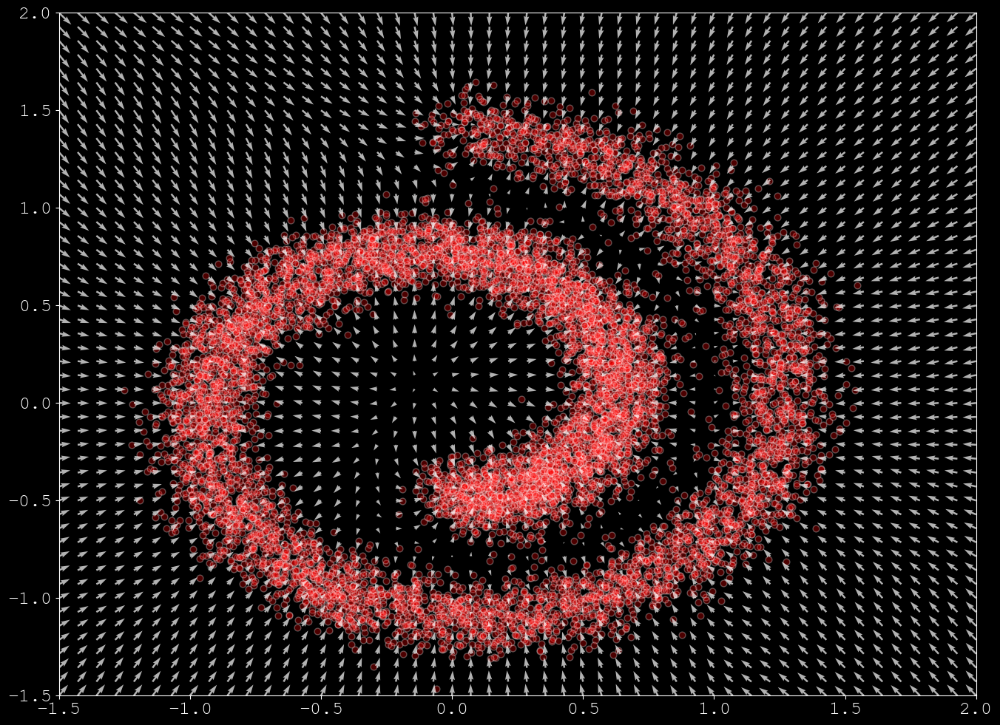

In [5]:
def plot_gradients(state, data, xlim=(-1.5, 2.0), ylim=(-1.5, 2.0), nx=50, ny=50, plot_scatter=True, alpha=1.0):
    xx = np.stack(np.meshgrid(np.linspace(*xlim, nx), np.linspace(*ylim, ny)), axis=-1).reshape(-1, 2)
    scores = state.apply_fn(state.params, xx)
    scores_norm = np.linalg.norm(scores, axis=-1, ord=2, keepdims=True)
    scores_log1p = scores / (scores_norm + 1e-9) * np.log1p(scores_norm)
    # Perform the plots
    
    if plot_scatter:
        plt.figure(figsize=(16,12))
        plt.scatter(data[:, 0], data[:, 1], alpha=0.3, color='red', edgecolor='white', s=40)
        plt.xlim(-1.5, 2.0)
        plt.ylim(-1.5, 2.0)
    
    quiver = plt.quiver(*xx.T, *scores_log1p.T, width=0.002, color='white', alpha=alpha)
    
    return quiver

def make_animation(Xt):
    X0 = np.tile(Xt[:1], (10, 1, 1))
    Xf = np.tile(Xt[-1:], (10, 1, 1))
    Xt = jnp.concatenate([X0, Xt, Xf])

    fig = plt.figure(figsize=(14, 10))
    ax = plt.gca()

    xlim = (Xt[..., 0].min() * 0.7, Xt[..., 0].max() * 0.7)
    ylim = (Xt[..., 1].min() * 0.7, Xt[..., 1].max() * 0.7)

    quiver = plot_gradients(state, data, xlim=xlim, ylim=ylim, nx=35, ny=35, plot_scatter=False, alpha=0.5)

    ax.axis("off")
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)

    scatter = ax.scatter(Xt[0, :, 0], Xt[0, :, 1])

    def animate(i):
        scatter.set_offsets(Xt[i])
        return (quiver, scatter,)

    anim = animation.FuncAnimation(
        fig,
        animate,
        init_func=lambda: animate(0),
        frames=range(0, len(Xt)),
        interval=100,
        repeat_delay=1000,
        blit=True,
    )

    return anim

plot_gradients(state, data, alpha=0.7);

In [6]:
@jax.jit
def sample_simple(state, x, n_steps=70, eps=1e-3):
    def step(x, i):
        x = x + eps * state.apply_fn(state.params, x)
        return x, x

    return jax.lax.scan(step, x, jnp.arange(n_steps))[1]

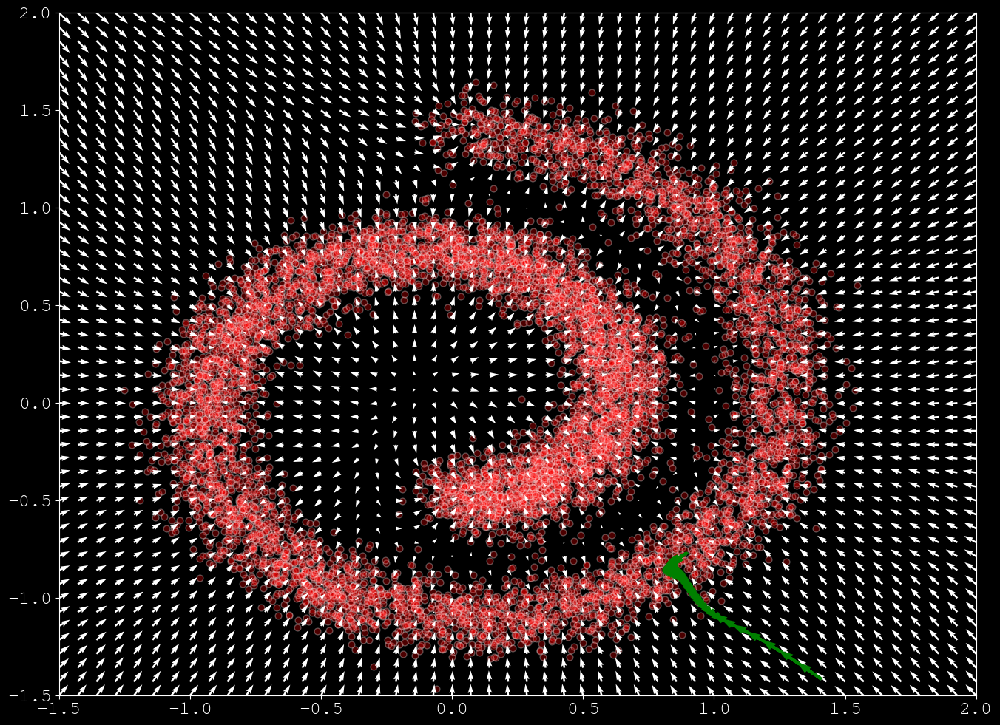

In [7]:
x = jnp.array([1.5, -1.5])[None]
samples = sample_simple(state, x)[:, 0]
plot_gradients(state, data)
# draw arrows for each  step
deltas = (samples[1:] - samples[:-1])
deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
for i, arrow in enumerate(deltas):
    plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="green", linewidth=3)

In [8]:
from IPython import display

x = np.random.normal(size=(500, 2))
samples = sample_simple(state, x)

anim = make_animation(samples)

print("Saving animation...")
anim.save("outputs/sample_simple.gif", writer="imagemagick")
plt.close()

display.Markdown("![sample_simple](outputs/sample_simple.gif)")

Saving animation...


![sample_simple](outputs/sample_simple.gif)

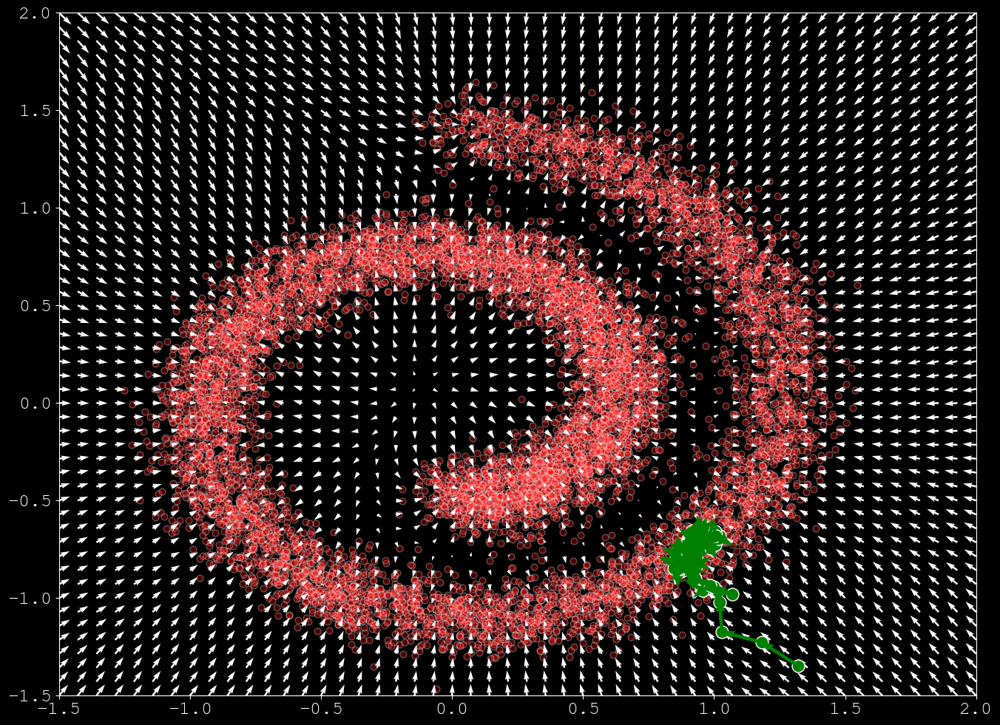

In [9]:
@jax.jit
def sample_langevin(state, x, rng, n_steps=100, eps=4e-3, decay=0.97, temperature=0.7):
    # create a step function to pass to jax.scan
    def step(s, i):
        x, rng, eps = s
        rng, key = jax.random.split(rng)
        z_t = jax.random.normal(key, shape=x.shape)
        x = x + (eps / 2) * state.apply_fn(state.params, x) + (jnp.sqrt(eps) * temperature * z_t)
        eps *= decay
        return (x, rng, eps), x

    return jax.lax.scan(step, (x, rng, eps), np.arange(n_steps))[1]

x = jnp.array([1.5, -1.5])[None]
rng = jax.random.PRNGKey(0)
samples = sample_langevin(state, x, rng)[:, 0]
plot_gradients(state, data)
plt.scatter(samples[:, 0], samples[:, 1], color='green', edgecolor='white', s=150)
# draw arrows for each mcmc step
deltas = (samples[1:] - samples[:-1])
deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
for i, arrow in enumerate(deltas):
    plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="green", linewidth=3)

In [10]:
x = np.random.normal(size=(500, 2))
key = jax.random.PRNGKey(0)
samples = sample_langevin(state, x, key)

anim = make_animation(samples)

print("Saving animation...")
anim.save("outputs/sample_langevin.gif", writer="imagemagick")
plt.close()

display.Markdown("![sample_langevin](outputs/sample_langevin.gif)")

Saving animation...


![sample_langevin](outputs/sample_langevin.gif)

In [11]:
def sliced_score_matching_loss(samples, params, key):
    vectors = jax.random.normal(key, shape = samples.shape)
    vectors = vectors / jnp.linalg.norm(vectors, axis=-1, keepdims=True)
    logp, jvp = jax.jvp(lambda x: model.apply(params, x), (samples,), (vectors,))
    norm_loss = (logp * vectors) ** 2 / 2
    v_jvp = jvp * vectors
    jacob_loss = v_jvp
    loss = jacob_loss + norm_loss
    return loss.mean(-1).mean(-1)

sliced_score_matching_loss(data[:10], params, jax.random.PRNGKey(42))

params = model.init(jax.random.PRNGKey(42), data)
state = train_state.TrainState.create(apply_fn=model.apply, params=params, tx=optax.adam(1e-3))
steps = 60_000

@jax.jit
def train_step(state, batch, rng):
  """Train for a single step."""
  rng, key = jax.random.split(rng)
  grads = jax.grad(sliced_score_matching_loss, argnums=1)(batch, state.params, key)
  state = state.apply_gradients(grads=grads)
  return state, rng
  
rng = jax.random.PRNGKey(0)
for t in tqdm(range(steps + 1)):
    batch_idx = np.random.choice(data.shape[0], size=128, replace=False)
    state, rng = train_step(state, data[batch_idx], rng)
    if ((t % (steps // 5)) == 0):
        rng, key = jax.random.split(rng)
        print(sliced_score_matching_loss(data, state.params, key))

  0%|          | 165/60001 [00:01<07:00, 142.40it/s]

-0.044433266


 20%|██        | 12235/60001 [00:09<00:32, 1483.37it/s]

-10.350134


 40%|████      | 24198/60001 [00:16<00:24, 1478.03it/s]

-11.437191


 60%|██████    | 36164/60001 [00:24<00:16, 1463.91it/s]

-11.798672


 81%|████████  | 48304/60001 [00:31<00:07, 1471.67it/s]

-11.848132


100%|██████████| 60001/60001 [00:39<00:00, 1534.25it/s]

-11.701261


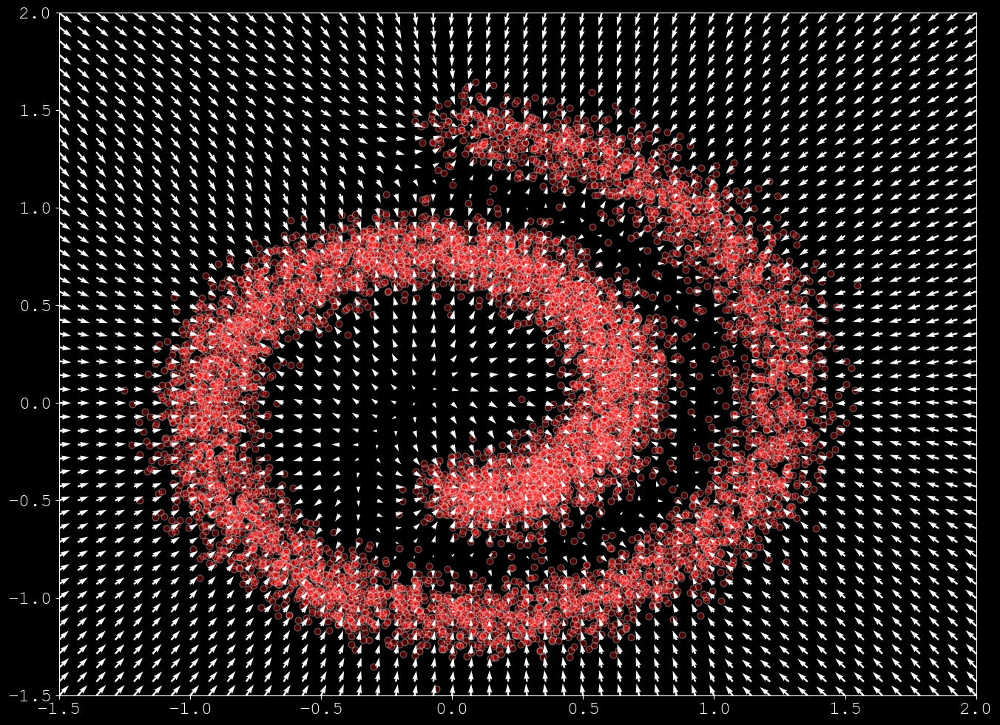

In [12]:
plot_gradients(state, data)

In [13]:
def denoising_score_matching(samples, params, key, sigma = 0.01):
    noise = jax.random.normal(key, samples.shape)
    perturbed_samples = samples + sigma * noise
    target = -noise / sigma
    scores = model.apply(params, perturbed_samples)
    loss = 1 / 2. * ((scores - target) ** 2).sum(axis=-1).mean(axis=0)
    return loss.mean()

denoising_score_matching(data[:10], params, jax.random.PRNGKey(42))

params = model.init(jax.random.PRNGKey(42), data)
state = train_state.TrainState.create(apply_fn=model.apply, params=params, tx=optax.adam(1e-3))
steps = 60_000

@jax.jit
def train_step(state, batch, rng):
  """Train for a single step."""
  rng, key = jax.random.split(rng)
  grads = jax.grad(denoising_score_matching, argnums=1)(batch, state.params, key)
  state = state.apply_gradients(grads=grads)
  return state, rng
  
rng = jax.random.PRNGKey(0)
for t in tqdm(range(steps + 1)):
    batch_idx = np.random.choice(data.shape[0], size=128, replace=False)
    state, rng = train_step(state, data[batch_idx], rng)
    if ((t % (steps // 5)) == 0):
        rng, key = jax.random.split(rng)
        print(denoising_score_matching(data, state.params, key))

  1%|          | 317/60001 [00:01<02:08, 465.47it/s]

9940.149


 21%|██        | 12318/60001 [00:08<00:30, 1539.68it/s]

10231.294


 40%|████      | 24241/60001 [00:15<00:21, 1632.70it/s]

10018.678


 60%|██████    | 36284/60001 [00:22<00:15, 1572.91it/s]

10076.699


 80%|████████  | 48260/60001 [00:29<00:07, 1602.77it/s]

10051.779


100%|██████████| 60001/60001 [00:36<00:00, 1645.38it/s]

9990.279


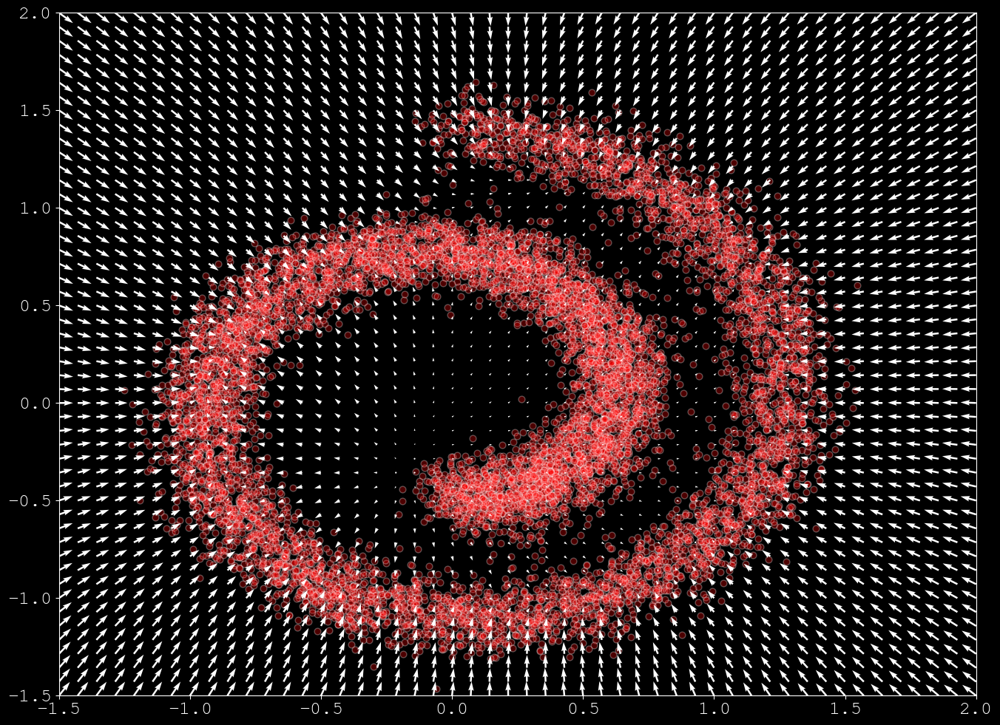

In [14]:
plot_gradients(state, data)

In [27]:
def anneal_dsm_score_estimation(samples, labels, sigmas, params, rng, anneal_power=2.):
    sigmas = sigmas[..., None]
    rng, key = jax.random.split(rng)
    noise = jax.random.normal(key, samples.shape)
    perturbed_samples = samples + sigmas * noise
    target = -noise / sigmas
    scores = model.apply(params, perturbed_samples, labels)
    loss = 1 / 2. * ((scores - target) ** 2).sum(axis=-1) * sigmas.squeeze() ** anneal_power
    return loss.mean(axis=0)


In [28]:
class ConditionalLinear(nn.Module):
    num_outputs: int
    num_classes: int
    @nn.compact
    def __call__(self, x, y):
        out = nn.Dense(self.num_outputs)(x)
        gamma = nn.Embed(self.num_classes, self.num_outputs)(y)
        return gamma * out

class ConditionalModel(nn.Module):
    num_classes: int
    @nn.compact
    def __call__(self, x, y):
        x = ConditionalLinear(128, self.num_classes)(x, y)
        x = nn.softplus(x)
        x = ConditionalLinear(128, self.num_classes)(x, y)
        x = nn.softplus(x)
        x = nn.Dense(2)(x)
        return x

In [29]:
sigma_begin = 1
sigma_end = 0.01
num_classes = 10
sigmas = np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_classes))
# Our approximation model
model = ConditionalModel(num_classes)
params = model.init(jax.random.PRNGKey(42), data[:10], np.zeros((10,), dtype=np.int32))
# Create ADAM optimizer over our model
optimizer = optax.adamw(1e-3)
state = train_state.TrainState.create(apply_fn=model.apply, params=params, tx=optimizer)
steps = 60_000

@jax.jit
def train_step(state, rng, samples, labels, sigmas):
  """Train for a single step."""
  rng, key = jax.random.split(rng)
  grads = jax.grad(anneal_dsm_score_estimation, argnums=3)(samples, labels, sigmas, state.params, key)
  state = state.apply_gradients(grads=grads)
  return state, rng
  
rng = jax.random.PRNGKey(0)
for t in tqdm(range(steps + 1)):
    batch_idx = np.random.choice(data.shape[0], size=128, replace=False)
    labels = np.random.randint(0, len(sigmas), size=len(batch_idx))
    state, rng = train_step(state, rng, data[batch_idx], labels, sigmas[labels])
    if ((t % (steps // 5)) == 0):
        rng, key = jax.random.split(rng)
        labels = np.random.randint(0, len(sigmas), size=len(data))
        print(anneal_dsm_score_estimation(data, labels, sigmas[labels], state.params, key))

  0%|          | 252/60001 [00:01<03:06, 319.97it/s]

1.0118934


 20%|██        | 12218/60001 [00:10<00:39, 1219.87it/s]

0.8234574


 40%|████      | 24186/60001 [00:18<00:28, 1269.33it/s]

0.8111734


 60%|██████    | 36207/60001 [00:27<00:18, 1260.53it/s]

0.8171205


 80%|████████  | 48263/60001 [00:35<00:09, 1282.67it/s]

0.79757255


100%|██████████| 60001/60001 [00:44<00:00, 1354.17it/s]

0.7964507


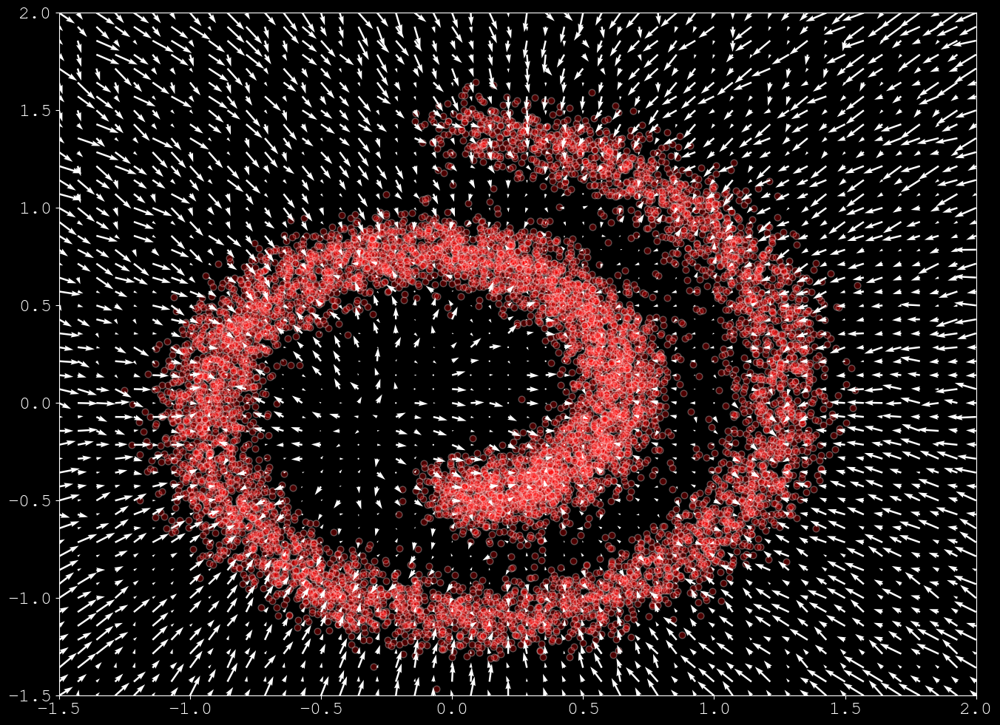

In [30]:
xx = np.stack(np.meshgrid(np.linspace(-1.5, 2.0, 50), np.linspace(-1.5, 2.0, 50)), axis=-1).reshape(-1, 2)
labels = np.random.randint(0, len(sigmas), (xx.shape[0],))
scores = state.apply_fn(state.params, xx, labels)
scores_norm = np.linalg.norm(scores, axis=-1, ord=2, keepdims=True)
scores_log1p = scores / (scores_norm + 1e-9) * np.log1p(scores_norm)
# Perform the plots
plt.figure(figsize=(16,12))
plt.scatter(*data.T, alpha=0.3, color='red', edgecolor='white', s=40)
plt.quiver(*xx.T, *scores_log1p.T, width=0.002, color='white')
plt.xlim(-1.5, 2.0)
plt.ylim(-1.5, 2.0);